In [34]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pandas as pd
from tqdm.notebook import tqdm
from scipy.stats import pearsonr
from scipy.spatial.distance import cosine
from functools import partial
import pickle
import os
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('fivethirtyeight')
sns.set_context("notebook", font_scale=1.2)

# Configurations
ROOT_DIR = Path("/home/azeez/Documents/Tri-MipRF/output/2025-05-13_12-59-05")
SAVE_DIR = Path("analysis_results")
SAVE_DIR.mkdir(exist_ok=True)

# Component keys for model extraction
COMPONENT_KEYS = {
    "fm": "field.encoding.fm",
    "mlp_base": "field.mlp_base",
    "mlp_head": "field.mlp_head",
    "direction_encoding": "field.direction_encoding",
}

# Variation types with their meaningful names
VARIATION_TYPES = {
    "base_000_000_000": "Base",
    "x_180_000_000": "X-180°", 
    "y_000_180_000": "Y-180°",
    "z_000_000_120": "Z-120°",
    "z_000_000_240": "Z-240°",
    "compound_090_000_090": "Compound"
}

# Functions for data loading and extraction
def scan_models_directory(root_dir):
    """Scan the root directory to find all models and their variations."""
    models = {
        obj.name: {
            var.name: var / "model.ckpt"
            for var in obj.iterdir()
            if (var / "model.ckpt").exists()
        }
        for obj in root_dir.iterdir() if obj.is_dir()
    }
    return models

def load_model_components(ckpt_path):
    """Load model components from checkpoint file."""
    sd = torch.load(ckpt_path, map_location="cpu")["model"]
    comps = {}
    comps["fm"] = sd[COMPONENT_KEYS["fm"]].numpy()
    comps["mlp_base"] = {k: sd[k].numpy() for k in sd if k.startswith(COMPONENT_KEYS["mlp_base"])}
    comps["mlp_head"] = {k: sd[k].numpy() for k in sd if k.startswith(COMPONENT_KEYS["mlp_head"])}
    comps["direction_encoding"] = {k: sd[k].numpy() for k in sd if k.startswith(COMPONENT_KEYS["direction_encoding"])}
    return comps

# Scan and display available models
models = scan_models_directory(ROOT_DIR)
print(f"Found {len(models)} objects with variations:")
to_pop = []
for obj, variations in models.items():
    print(f"- {obj}: {len(variations)} variations")
    if len(variations) != 6:
        to_pop.append(obj)

for tp in to_pop:
    models.pop(tp, None)
    print(f"Had to pop {tp}")

while len(models.keys()) > 50:
    models.pop(list(models.keys())[0])

print(f"Working on {len(models.keys())} models")

# Cache file path for saving/loading extracted data
CACHE_FILE = SAVE_DIR / "model_components_cache.pkl"

Found 210 objects with variations:
- Book_Stack3: 6 variations
- Build8: 6 variations
- UtilitySink: 6 variations
- archway_small_frame_part_small1: 6 variations
- FenceStonePilar1_v2: 6 variations
- RG-Dungeon_Flask-02: 6 variations
- Stone_high: 6 variations
- four_low: 6 variations
- Furniture_Stool_1: 6 variations
- Pet_1505_D: 6 variations
- oartonWindmillBase: 6 variations
- hamtaro_ball_tri: 6 variations
- Caisse: 6 variations
- glass_broken: 6 variations
- Leafs_0: 6 variations
- Rock4B: 6 variations
- Apple: 6 variations
- SciFi_Modular_Tile_White_06: 6 variations
- pot_3_destructible: 6 variations
- Cupola 1: 6 variations
- Building_office: 6 variations
- link3: 6 variations
- fool_hit_front_with_root_motion: 6 variations
- Prop_Gravestone_Stone_Broken_03: 6 variations
- mesh_shredder: 6 variations
- Props_Mines: 6 variations
- barrel (1): 6 variations
- grass_top_1x1_tile_front: 6 variations
- Lockers : 6 variations
- streetlightBase: 6 variations
- CardBoardLong1: 6 variati

In [35]:
## 2. Extract and Process Model Components

def extract_all_components(models, cache_file=None):
    """Extract components from all models with caching support."""
    if cache_file and os.path.exists(cache_file):
        print(f"Loading cached components from {cache_file}")
        with open(cache_file, 'rb') as f:
            return pickle.load(f)
    
    print("Extracting components from all models...")
    all_components = {}
    
    for obj_name, variations in tqdm(models.items()):
        all_components[obj_name] = {}
        for var_name, ckpt_path in variations.items():
            try:
                all_components[obj_name][var_name] = load_model_components(ckpt_path)
            except Exception as e:
                print(f"Error loading {obj_name}/{var_name}: {e}")
    
    if cache_file:
        print(f"Saving components to cache: {cache_file}")
        with open(cache_file, 'wb') as f:
            pickle.dump(all_components, f)
    
    return all_components

# Extract all model components (or load from cache)
all_components = extract_all_components(models, CACHE_FILE)
print(f"Components extracted for {len(all_components)} objects")

# Helper functions for analysis
def compute_cosine_similarity(a, b):
    """Compute cosine similarity between two arrays."""
    a_flat = a.reshape(-1)
    b_flat = b.reshape(-1)
    return 1 - cosine(a_flat, b_flat)

def compute_l2_distance(a, b):
    """Compute L2 distance between two arrays."""
    a_flat = a.reshape(-1)
    b_flat = b.reshape(-1)
    return np.sqrt(np.sum((a_flat - b_flat) ** 2))

def compute_pearson_correlation(a, b):
    """Compute Pearson correlation between two arrays."""
    a_flat = a.reshape(-1)
    b_flat = b.reshape(-1)
    corr, _ = pearsonr(a_flat, b_flat)
    return corr

print(list(models.keys()))

Loading cached components from analysis_results/model_components_cache.pkl
Components extracted for 50 objects
['UFO_Final', 'ToiletHok', 'quan', 'Anim_AlienGirl_Idle', 'Spider_Bot_V5', 'Pilar_Med_unity', 'BoxSet_01', 'Plane_Led_45', 'Milk_02', 'ATO3-1', 'Coals.1', 'industrial_ramp', 'goat_jumping', 'ShiTou01 1', 'Camino_Watermelon_mesh', 'Camp1_Brick3', 'Tree_Little_One', 'bait', 'SKELL', 'mesh_daisies_bundle', 'pickupTruckFBX', 'choco_icon', 'Gedung 4', 'gundam_helmet_00_2', 'watchtowers_low', 'Chr_ArmUpperRight_Male_08_Static', 'Basket_Large', 'roof_05', 'WardRobe_1B', 'single_turn_lake', 'Village_Cauldron_Var1', 'Square_Lock_Flat_anim', 'Blocker_wall2_5x', 'shoue', 'Pipe_Big_Adapter', 'treestomp_lowpoly', 'housev2', 'uploads_files_2125890_Moon', 'table_simple_test', 'Harvestable2Obj', 'RW_LP_CP_Item_TableCloth.002', 'Building_office_LOd1', 'Boardgame_Piece_Anagram_Letter_P_01', 'Player character model@Great Sword Slash', 'Unit_Right_Prism', 'StrongSphere', 'guopin', 'Lamp_lod1', 'm

Analyzing feature maps for example object: housev2


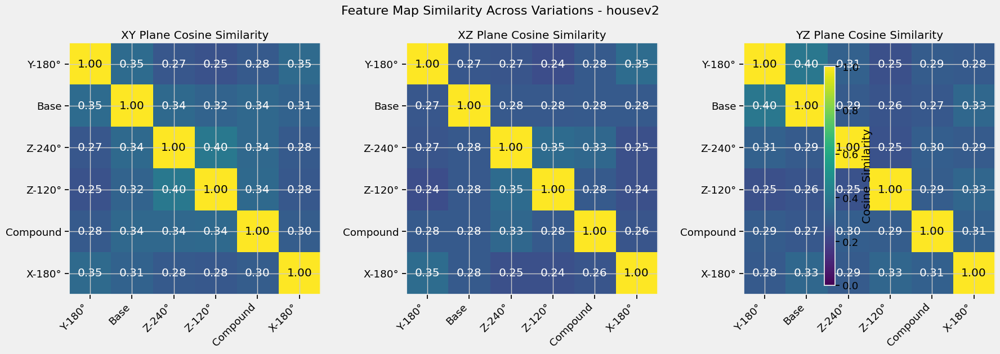

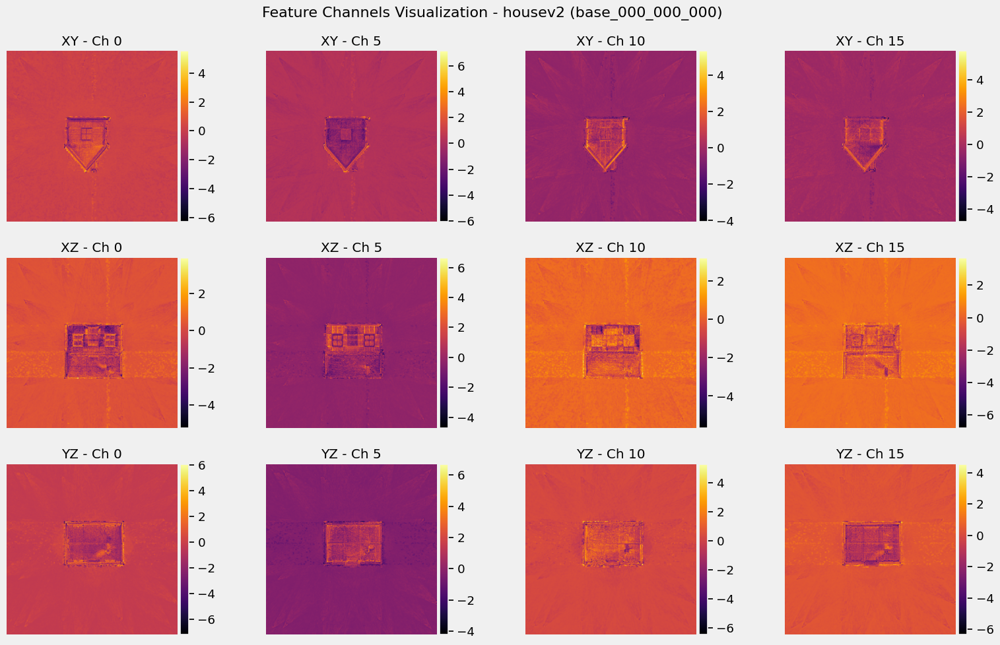

In [36]:
## 3. Feature Map Analysis

def analyze_feature_maps_single_object(obj_name, components):
    """Analyze feature maps for a single object's variations."""
    variations = list(components.keys())
    n_variations = len(variations)
    
    # Similarity matrices (one per plane)
    cosine_sim_matrix = np.zeros((3, n_variations, n_variations))
    
    # Calculate cross-variation similarities
    for i, var1 in enumerate(variations):
        for j, var2 in enumerate(variations):
            for plane in range(3):  # For each of the three planes
                fm1 = components[var1]["fm"][plane]
                fm2 = components[var2]["fm"][plane]
                cosine_sim_matrix[plane, i, j] = compute_cosine_similarity(fm1, fm2)
    
    # Feature statistics
    feature_stats = {var: {} for var in variations}
    for var in variations:
        fm = components[var]["fm"]
        for plane in range(3):
            feature_stats[var][f"plane_{plane}_mean"] = np.mean(fm[plane])
            feature_stats[var][f"plane_{plane}_std"] = np.std(fm[plane])
            feature_stats[var][f"plane_{plane}_min"] = np.min(fm[plane])
            feature_stats[var][f"plane_{plane}_max"] = np.max(fm[plane])
    
    return {
        "cosine_similarity": cosine_sim_matrix,
        "feature_stats": feature_stats,
        "variations": variations
    }

def visualize_feature_maps(obj_name, analysis_results, save_dir=None):
    """Visualize feature map analysis results for a single object."""
    cosine_sim = analysis_results["cosine_similarity"]
    variations = analysis_results["variations"]
    var_labels = [VARIATION_TYPES.get(v, v) for v in variations]
    
    # Combined visualization of all three planes
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    plane_names = ["XY Plane", "XZ Plane", "YZ Plane"]
    
    for plane in range(3):
        ax = axes[plane]
        im = ax.imshow(cosine_sim[plane], vmin=0, vmax=1, cmap='viridis')
        ax.set_title(f"{plane_names[plane]} Cosine Similarity")
        ax.set_xticks(np.arange(len(var_labels)))
        ax.set_yticks(np.arange(len(var_labels)))
        ax.set_xticklabels(var_labels, rotation=45, ha="right")
        ax.set_yticklabels(var_labels)
        
        # Add text annotations
        for i in range(len(var_labels)):
            for j in range(len(var_labels)):
                ax.text(j, i, f"{cosine_sim[plane, i, j]:.2f}", 
                        ha="center", va="center", 
                        color="white" if cosine_sim[plane, i, j] < 0.7 else "black")
    
    fig.colorbar(im, ax=axes, shrink=0.8, label="Cosine Similarity")
    fig.suptitle(f"Feature Map Similarity Across Variations - {obj_name}", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_feature_map_similarity.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Analyze feature maps for a single example object
example_obj = list(all_components.keys())[13]  # Use the first object as an example
example_obj = 'WardRobe_1B'
example_obj = 'housev2'
# example_obj = 'treestomp_lowpoly'
print(f"Analyzing feature maps for example object: {example_obj}")
fm_analysis = analyze_feature_maps_single_object(example_obj, all_components[example_obj])
visualize_feature_maps(example_obj, fm_analysis, SAVE_DIR)

def visualize_feature_channels(obj_name, components, save_dir=None):
    """Visualize feature channels for one variation of an object."""
    # Select base variation
    base_var = "base_000_000_000"
    if base_var not in components:
        base_var = list(components.keys())[0]  # Fallback
    
    # Get feature map
    fm = components[base_var]["fm"]
    
    # Select a subset of channels to visualize (4 out of 16)
    channels_to_show = [0, 5, 10, 15]
    
    fig, axes = plt.subplots(3, len(channels_to_show), figsize=(16, 10))
    plane_names = ["XY", "XZ", "YZ"]
    
    for p, plane in enumerate(range(3)):
        for c, channel in enumerate(channels_to_show):
            ax = axes[p, c]
            # Take a slice of the feature map for this plane and channel
            channel_data = fm[plane, :, :, channel]
            
            # Normalize for better visualization
            norm = Normalize(vmin=np.min(channel_data), vmax=np.max(channel_data))
            im = ax.imshow(channel_data, cmap='inferno', norm=norm)
            
            ax.set_title(f"{plane_names[p]} - Ch {channel}")
            ax.axis('off')
            
            # Add colorbar for each subplot
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)
    
    fig.suptitle(f"Feature Channels Visualization - {obj_name} ({base_var})", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_feature_channels.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Visualize feature channels for the example object
visualize_feature_channels(example_obj, all_components[example_obj], SAVE_DIR)

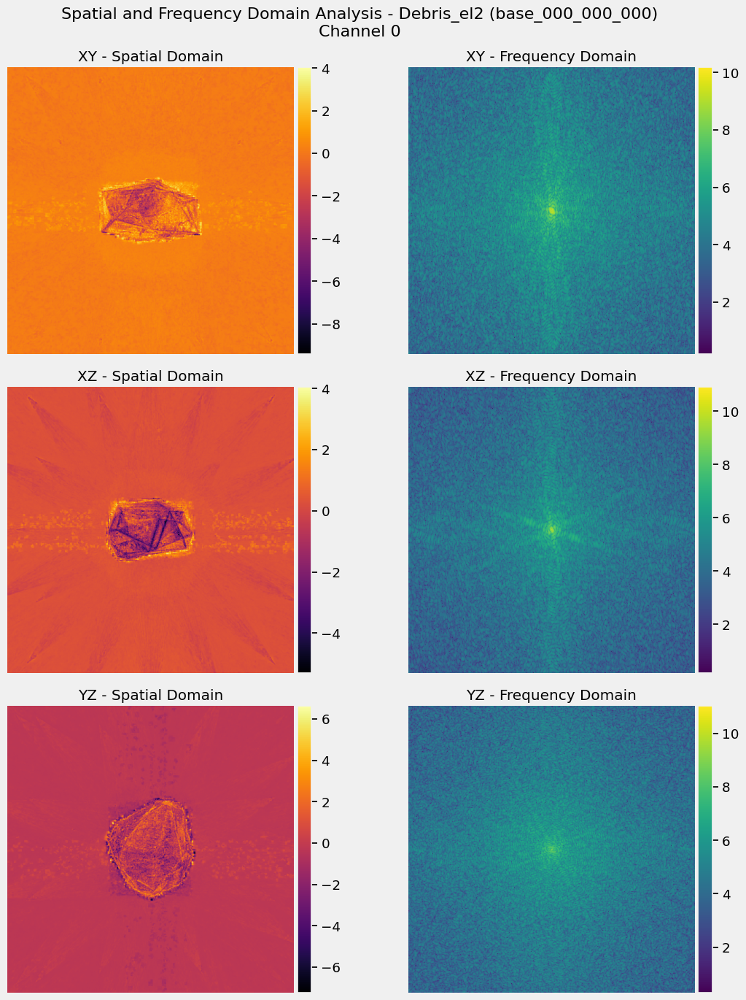

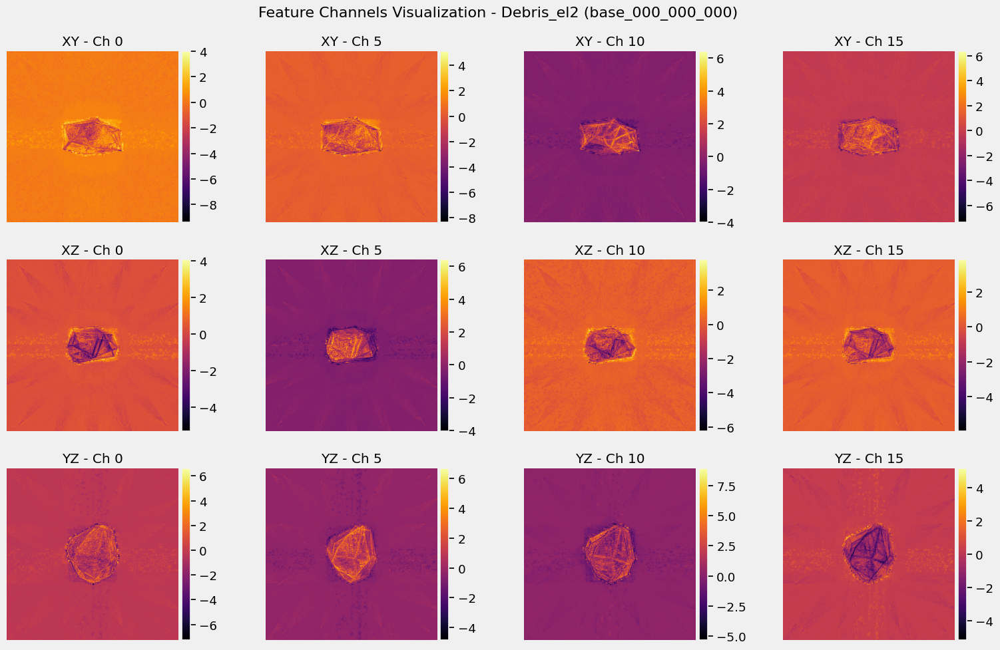

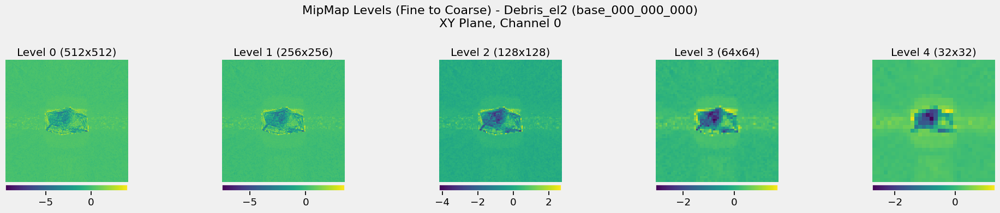

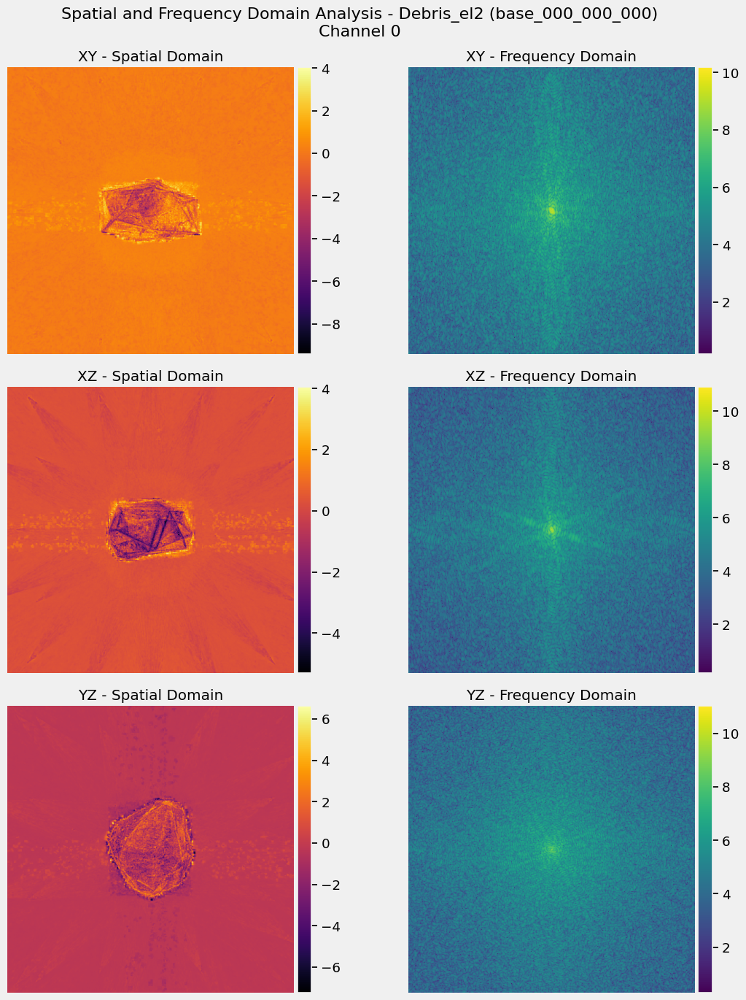

In [ ]:
def visualize_feature_channels(obj_name, components, save_dir=None):
    """Visualize feature channels for one variation of an object."""
    # Select base variation
    base_var = "base_000_000_000"
    if base_var not in components:
        base_var = list(components.keys())[0]  # Fallback
    
    # Get feature map
    fm = components[base_var]["fm"]
    
    # Select a subset of channels to visualize (4 out of 16)
    channels_to_show = [0, 5, 10, 15]
    
    fig, axes = plt.subplots(3, len(channels_to_show), figsize=(16, 10))
    plane_names = ["XY", "XZ", "YZ"]
    
    for p, plane in enumerate(range(3)):
        for c, channel in enumerate(channels_to_show):
            ax = axes[p, c]
            # Take a slice of the feature map for this plane and channel
            channel_data = fm[plane, :, :, channel]
            
            # Normalize for better visualization
            norm = Normalize(vmin=np.min(channel_data), vmax=np.max(channel_data))
            im = ax.imshow(channel_data, cmap='inferno', norm=norm)
            
            ax.set_title(f"{plane_names[p]} - Ch {channel}")
            ax.axis('off')
            
            # Add colorbar for each subplot
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)
    
    fig.suptitle(f"Feature Channels Visualization - {obj_name} ({base_var})", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_feature_channels.png", dpi=300, bbox_inches="tight")
    
    # return fig

def visualize_mipmap_levels(obj_name, components, save_dir=None):
    """Visualize mipmap levels from fine to coarse for a single channel."""
    # Select base variation
    base_var = "base_000_000_000"
    if base_var not in components:
        base_var = list(components.keys())[0]  # Fallback
    
    # Get feature map
    fm = components[base_var]["fm"]
    
    # Choose a representative channel and plane
    channel = 0  # Using channel 0
    plane = 0    # Using XY plane (first plane)
    
    # Create different mipmap levels by downsampling
    # We'll create 5 levels (original, and 4 downsampled versions)
    mipmap_levels = []
    feature_data = fm[plane, :, :, channel]
    
    # Original level
    mipmap_levels.append(("Level 0 (512x512)", feature_data))
    
    # Generate 4 progressively coarser levels
    current_data = feature_data
    for i in range(1, 5):
        # Downsample by factor of 2 each time
        h, w = current_data.shape
        downsampled = np.zeros((h//2, w//2))
        
        for y in range(0, h//2):
            for x in range(0, w//2):
                # Average 2x2 block
                block = current_data[y*2:y*2+2, x*2:x*2+2]
                downsampled[y, x] = np.mean(block)
        
        size = downsampled.shape[0]
        mipmap_levels.append((f"Level {i} ({size}x{size})", downsampled))
        current_data = downsampled
    
    # Create figure for mipmap visualization
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    
    # Plot each mipmap level
    for i, (level_name, level_data) in enumerate(mipmap_levels):
        ax = axes[i]
        norm = Normalize(vmin=np.min(level_data), vmax=np.max(level_data))
        im = ax.imshow(level_data, cmap='viridis', norm=norm, interpolation='nearest')
        ax.set_title(level_name)
        ax.axis('off')
        
        # Add colorbar
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("bottom", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax, orientation='horizontal')
    
    fig.suptitle(f"MipMap Levels (Fine to Coarse) - {obj_name} ({base_var})\nXY Plane, Channel 0", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_mipmap_levels.png", dpi=300, bbox_inches="tight")
    
    # return fig

def visualize_frequency_analysis(obj_name, components, save_dir=None):
    """Visualize frequency components of feature maps using FFT."""
    # Select base variation
    base_var = "base_000_000_000"
    if base_var not in components:
        base_var = list(components.keys())[0]  # Fallback
    
    # Get feature map
    fm = components[base_var]["fm"]
    
    # Select channels to visualize
    channel = 0  # Use channel 0 for frequency analysis
    
    fig, axes = plt.subplots(3, 2, figsize=(12, 14))
    plane_names = ["XY", "XZ", "YZ"]
    
    for p, plane in enumerate(range(3)):
        # Original feature map
        feature_data = fm[plane, :, :, channel]
        
        # Compute FFT
        fft_data = np.fft.fft2(feature_data)
        fft_shifted = np.fft.fftshift(fft_data)
        magnitude = np.log1p(np.abs(fft_shifted))
        
        # Plot original feature
        ax_orig = axes[p, 0]
        norm_orig = Normalize(vmin=np.min(feature_data), vmax=np.max(feature_data))
        im_orig = ax_orig.imshow(feature_data, cmap='inferno', norm=norm_orig)
        ax_orig.set_title(f"{plane_names[p]} - Spatial Domain")
        ax_orig.axis('off')
        divider = make_axes_locatable(ax_orig)
        cax_orig = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im_orig, cax=cax_orig)
        
        # Plot frequency spectrum
        ax_freq = axes[p, 1]
        norm_freq = Normalize(vmin=np.min(magnitude), vmax=np.max(magnitude))
        im_freq = ax_freq.imshow(magnitude, cmap='viridis', norm=norm_freq)
        ax_freq.set_title(f"{plane_names[p]} - Frequency Domain")
        ax_freq.axis('off')
        divider = make_axes_locatable(ax_freq)
        cax_freq = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im_freq, cax=cax_freq)
    
    fig.suptitle(f"Spatial and Frequency Domain Analysis - {obj_name} ({base_var})\nChannel 0", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_frequency_analysis.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Visualize feature channels for the example object
visualize_feature_channels(example_obj, all_components[example_obj], SAVE_DIR)

# Add mipmap level visualization
visualize_mipmap_levels(example_obj, all_components[example_obj], SAVE_DIR)

# Add frequency domain analysis
visualize_frequency_analysis(example_obj, all_components[example_obj], SAVE_DIR)

Computing population-level feature map similarity statistics...
Analyzed 50 objects with all variations


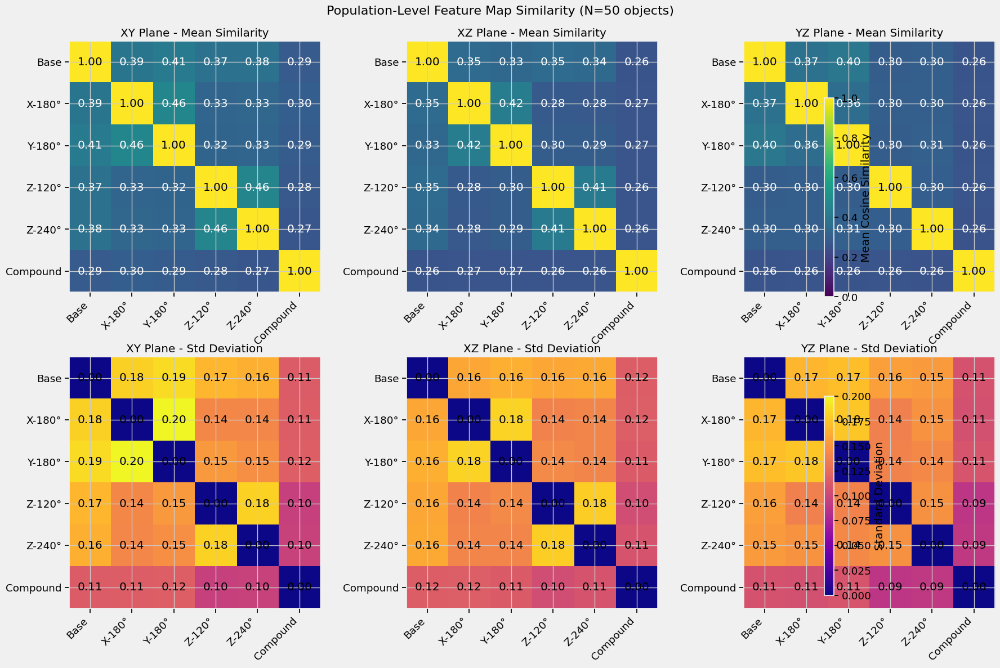

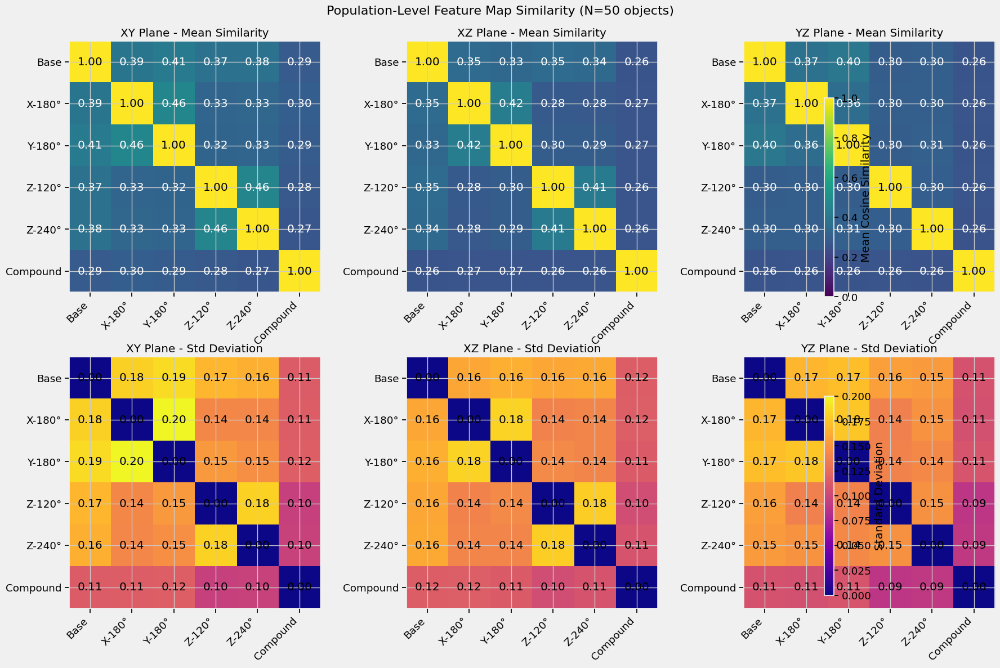

In [ ]:
## 4. Population-Level Feature Map Analysis

def compute_population_similarity_stats(all_components):
    """Compute population-level statistics for feature map similarities."""
    # Initialize population stats
    n_variations = len(VARIATION_TYPES)
    pop_cosine_sim = np.zeros((3, n_variations, n_variations))
    pop_cosine_std = np.zeros((3, n_variations, n_variations))
    valid_objects = []
    
    # Track all variation pairs for each object
    all_object_similarities = {}
    
    for obj_name, components in all_components.items():
        # Skip objects without all variation types
        if not all(var in components for var in VARIATION_TYPES):
            continue
        
        valid_objects.append(obj_name)
        all_object_similarities[obj_name] = np.zeros((3, n_variations, n_variations))
        
        for i, (var1_key, var1_name) in enumerate(VARIATION_TYPES.items()):
            for j, (var2_key, var2_name) in enumerate(VARIATION_TYPES.items()):
                for plane in range(3):
                    fm1 = components[var1_key]["fm"][plane]
                    fm2 = components[var2_key]["fm"][plane]
                    sim = compute_cosine_similarity(fm1, fm2)
                    all_object_similarities[obj_name][plane, i, j] = sim
    
    # Calculate mean and std across objects
    similarities_array = np.array([all_object_similarities[obj] for obj in valid_objects])
    pop_cosine_sim = np.mean(similarities_array, axis=0)
    pop_cosine_std = np.std(similarities_array, axis=0)
    
    return {
        "mean": pop_cosine_sim,
        "std": pop_cosine_std,
        "all_similarities": all_object_similarities,
        "valid_objects": valid_objects
    }

def visualize_population_similarity(pop_stats, save_dir=None):
    """Visualize population-level feature map similarity statistics."""
    var_names = list(VARIATION_TYPES.values())
    
    # Create a 2x3 grid: top row for means, bottom row for std devs
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    plane_names = ["XY Plane", "XZ Plane", "YZ Plane"]
    
    for plane in range(3):
        # Plot mean similarity
        ax_mean = axes[0, plane]
        im_mean = ax_mean.imshow(pop_stats["mean"][plane], vmin=0, vmax=1, cmap='viridis')
        ax_mean.set_title(f"{plane_names[plane]} - Mean Similarity")
        ax_mean.set_xticks(np.arange(len(var_names)))
        ax_mean.set_yticks(np.arange(len(var_names)))
        ax_mean.set_xticklabels(var_names, rotation=45, ha="right")
        ax_mean.set_yticklabels(var_names)
        
        # Add text annotations for mean
        for i in range(len(var_names)):
            for j in range(len(var_names)):
                ax_mean.text(j, i, f"{pop_stats['mean'][plane, i, j]:.2f}", 
                        ha="center", va="center", 
                        color="white" if pop_stats['mean'][plane, i, j] < 0.7 else "black")
        
        # Plot standard deviation
        ax_std = axes[1, plane]
        im_std = ax_std.imshow(pop_stats["std"][plane], vmin=0, vmax=0.2, cmap='plasma')
        ax_std.set_title(f"{plane_names[plane]} - Std Deviation")
        ax_std.set_xticks(np.arange(len(var_names)))
        ax_std.set_yticks(np.arange(len(var_names)))
        ax_std.set_xticklabels(var_names, rotation=45, ha="right")
        ax_std.set_yticklabels(var_names)
        
        # Add text annotations for std
        for i in range(len(var_names)):
            for j in range(len(var_names)):
                ax_std.text(j, i, f"{pop_stats['std'][plane, i, j]:.2f}", 
                        ha="center", va="center", color="black")
    
    # Add colorbars
    cbar_mean = fig.colorbar(im_mean, ax=axes[0, :], shrink=0.8, label="Mean Cosine Similarity")
    cbar_std = fig.colorbar(im_std, ax=axes[1, :], shrink=0.8, label="Standard Deviation")
    
    fig.suptitle(f"Population-Level Feature Map Similarity (N={len(pop_stats['valid_objects'])} objects)", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / "population_feature_map_similarity.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Compute and visualize population-level statistics
print("Computing population-level feature map similarity statistics...")
pop_stats = compute_population_similarity_stats(all_components)
print(f"Analyzed {len(pop_stats['valid_objects'])} objects with all variations")
visualize_population_similarity(pop_stats, SAVE_DIR)

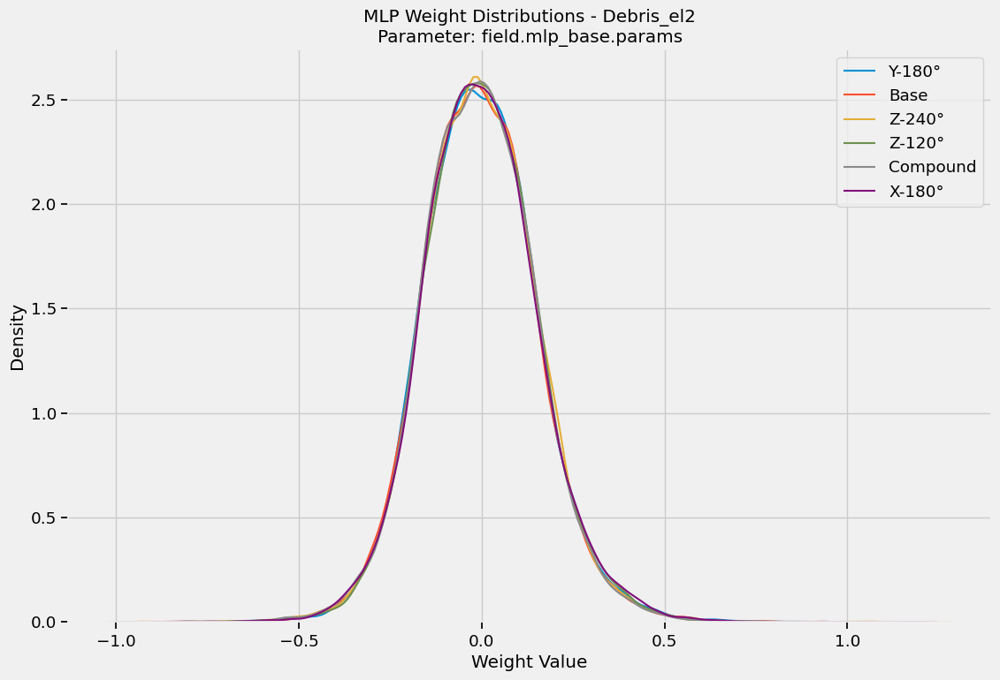

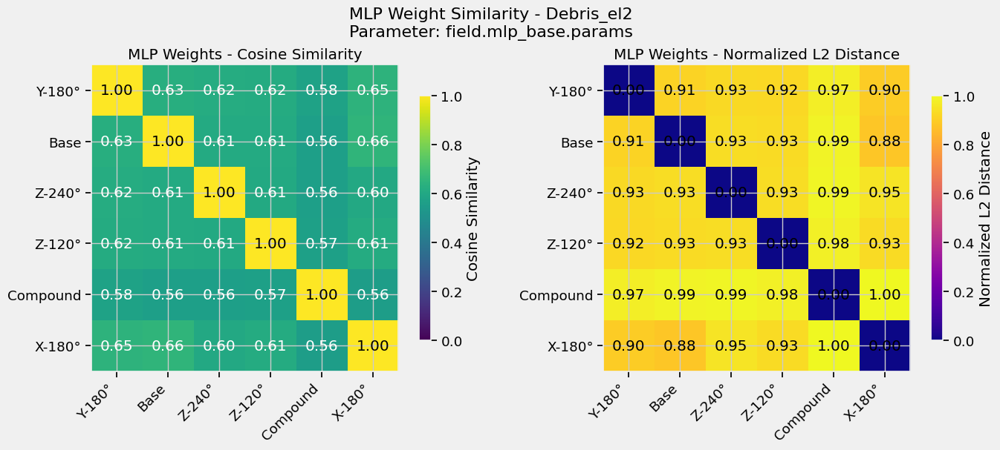

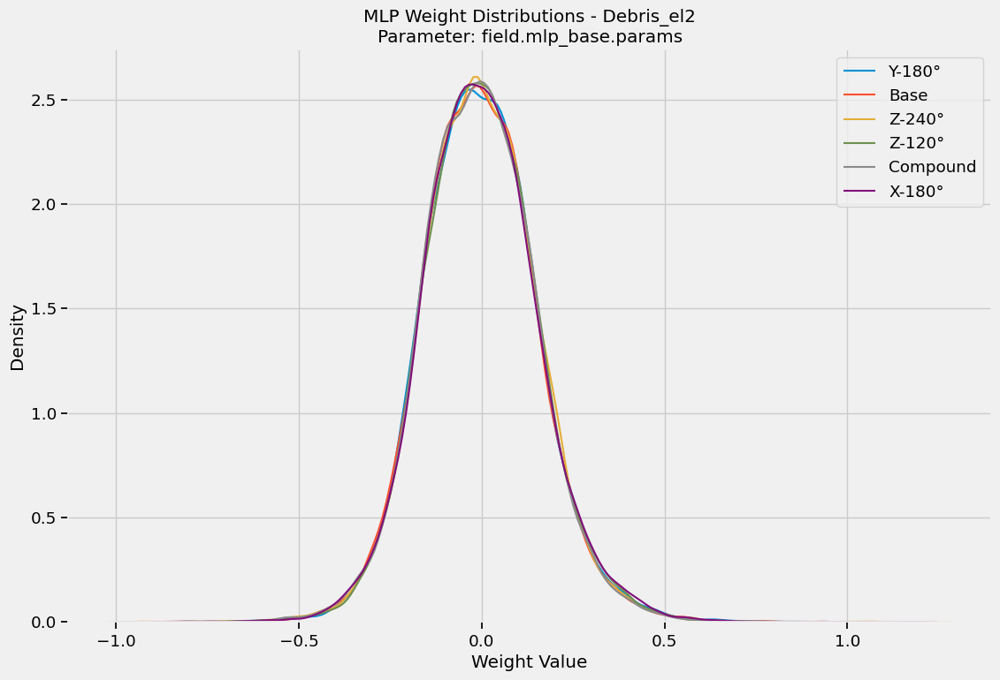

In [ ]:
## 5. MLP Weight Analysis

def analyze_mlp_weights_single_object(obj_name, components):
    """Analyze MLP weights for a single object's variations."""
    variations = list(components.keys())
    n_variations = len(variations)
    
    # For simplicity, analyze only the first layer of mlp_base
    param_key = list(components[variations[0]]["mlp_base"].keys())[0]
    
    # Similarity matrix for this parameter
    cosine_sim_matrix = np.zeros((n_variations, n_variations))
    l2_dist_matrix = np.zeros((n_variations, n_variations))
    
    # Calculate cross-variation similarities
    for i, var1 in enumerate(variations):
        for j, var2 in enumerate(variations):
            weights1 = components[var1]["mlp_base"][param_key]
            weights2 = components[var2]["mlp_base"][param_key]
            cosine_sim_matrix[i, j] = compute_cosine_similarity(weights1, weights2)
            l2_dist_matrix[i, j] = compute_l2_distance(weights1, weights2)
    
    # Weight statistics
    weight_stats = {var: {} for var in variations}
    for var in variations:
        weights = components[var]["mlp_base"][param_key]
        weight_stats[var]["mean"] = np.mean(weights)
        weight_stats[var]["std"] = np.std(weights)
        weight_stats[var]["min"] = np.min(weights)
        weight_stats[var]["max"] = np.max(weights)
    
    return {
        "cosine_similarity": cosine_sim_matrix,
        "l2_distance": l2_dist_matrix,
        "weight_stats": weight_stats,
        "variations": variations,
        "param_key": param_key
    }

def visualize_mlp_weights(obj_name, analysis_results, save_dir=None):
    """Visualize MLP weight analysis results for a single object."""
    cosine_sim = analysis_results["cosine_similarity"]
    l2_dist = analysis_results["l2_distance"]
    variations = analysis_results["variations"]
    var_labels = [VARIATION_TYPES.get(v, v) for v in variations]
    
    # Create a 1x2 grid: cosine similarity and L2 distance
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # Plot cosine similarity
    ax_cos = axes[0]
    im_cos = ax_cos.imshow(cosine_sim, vmin=0, vmax=1, cmap='viridis')
    ax_cos.set_title(f"MLP Weights - Cosine Similarity")
    ax_cos.set_xticks(np.arange(len(var_labels)))
    ax_cos.set_yticks(np.arange(len(var_labels)))
    ax_cos.set_xticklabels(var_labels, rotation=45, ha="right")
    ax_cos.set_yticklabels(var_labels)
    
    # Add text annotations
    for i in range(len(var_labels)):
        for j in range(len(var_labels)):
            ax_cos.text(j, i, f"{cosine_sim[i, j]:.2f}", 
                    ha="center", va="center", 
                    color="white" if cosine_sim[i, j] < 0.7 else "black")
    
    fig.colorbar(im_cos, ax=ax_cos, shrink=0.8, label="Cosine Similarity")
    
    # Plot L2 distance - normalize for better visualization
    l2_norm = l2_dist / np.max(l2_dist)
    ax_l2 = axes[1]
    im_l2 = ax_l2.imshow(l2_norm, cmap='plasma')
    ax_l2.set_title(f"MLP Weights - Normalized L2 Distance")
    ax_l2.set_xticks(np.arange(len(var_labels)))
    ax_l2.set_yticks(np.arange(len(var_labels)))
    ax_l2.set_xticklabels(var_labels, rotation=45, ha="right")
    ax_l2.set_yticklabels(var_labels)
    
    # Add text annotations
    for i in range(len(var_labels)):
        for j in range(len(var_labels)):
            ax_l2.text(j, i, f"{l2_norm[i, j]:.2f}", 
                    ha="center", va="center", color="black")
    
    fig.colorbar(im_l2, ax=ax_l2, shrink=0.8, label="Normalized L2 Distance")
    
    fig.suptitle(f"MLP Weight Similarity - {obj_name}\nParameter: {analysis_results['param_key']}", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_mlp_weight_similarity.png", dpi=300, bbox_inches="tight")
    
    return fig

# Analyze MLP weights for a single example object
mlp_analysis = analyze_mlp_weights_single_object(example_obj, all_components[example_obj])
visualize_mlp_weights(example_obj, mlp_analysis, SAVE_DIR)

def visualize_weight_distributions(obj_name, components, save_dir=None):
    """Visualize MLP weight distributions for all variations of an object."""
    variations = list(components.keys())
    var_labels = [VARIATION_TYPES.get(v, v) for v in variations]
    
    # For simplicity, analyze only the first layer of mlp_base
    param_key = list(components[variations[0]]["mlp_base"].keys())[0]
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Plot weight distributions
    for i, var in enumerate(variations):
        weights = components[var]["mlp_base"][param_key].flatten()
        sns.kdeplot(weights, label=var_labels[i], ax=ax)
    
    ax.set_title(f"MLP Weight Distributions - {obj_name}\nParameter: {param_key}")
    ax.set_xlabel("Weight Value")
    ax.set_ylabel("Density")
    ax.legend()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_weight_distributions.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Visualize weight distributions for the example object
visualize_weight_distributions(example_obj, all_components[example_obj], SAVE_DIR)

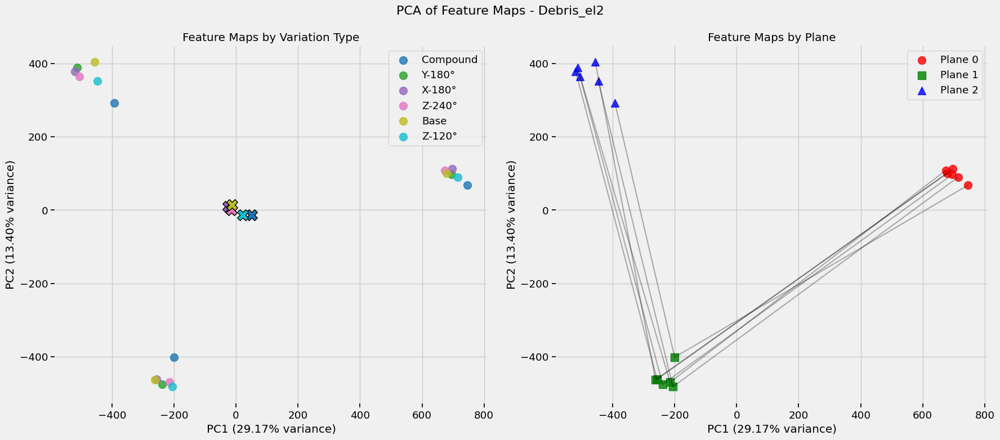

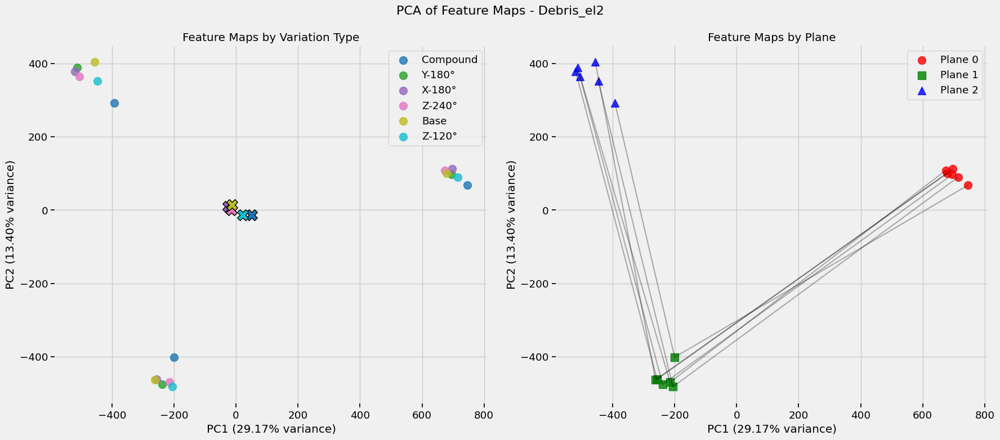

In [ ]:
## 6. Dimensionality Reduction for Feature Maps

def perform_feature_map_pca(obj_name, components, n_components=2):
    """Perform PCA on feature maps for a single object's variations."""
    variations = list(components.keys())
    var_labels = [VARIATION_TYPES.get(v, v) for v in variations]
    
    # Flatten feature maps for each variation and plane
    fm_data = []
    labels = []
    plane_labels = []
    
    for var_idx, var in enumerate(variations):
        for plane in range(3):
            fm = components[var]["fm"][plane]
            fm_flat = fm.reshape(1, -1)  # Flatten to a single vector
            fm_data.append(fm_flat)
            labels.append(var)
            plane_labels.append(plane)
    
    # Stack all flattened feature maps
    fm_data = np.vstack(fm_data)
    
    # Perform PCA
    pca = PCA(n_components=n_components)
    fm_pca = pca.fit_transform(fm_data)
    
    return {
        "pca_data": fm_pca,
        "variation_labels": labels,
        "plane_labels": plane_labels,
        "var_display_labels": var_labels,
        "explained_variance": pca.explained_variance_ratio_
    }

def visualize_feature_map_pca(obj_name, pca_results, save_dir=None):
    """Visualize PCA results of feature maps."""
    pca_data = pca_results["pca_data"]
    labels = pca_results["variation_labels"]
    plane_labels = pca_results["plane_labels"]
    var_display_labels = pca_results["var_display_labels"]
    explained_var = pca_results["explained_variance"]
    
    # Create figure with two subplots: by variation and by plane
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # Colors for variations
    var_colors = plt.cm.tab10(np.linspace(0, 1, len(set(labels))))
    var_color_map = {var: var_colors[i] for i, var in enumerate(set(labels))}
    
    # Colors for planes
    plane_colors = ['r', 'g', 'b']
    
    # Plot by variation
    ax_var = axes[0]
    for var in set(labels):
        mask = np.array(labels) == var
        ax_var.scatter(
            pca_data[mask, 0], 
            pca_data[mask, 1], 
            c=[var_color_map[var]], 
            label=VARIATION_TYPES.get(var, var),
            alpha=0.8,
            s=100
        )
    
    # Plot centroids for each variation
    for var in set(labels):
        mask = np.array(labels) == var
        centroid = np.mean(pca_data[mask], axis=0)
        ax_var.scatter(
            centroid[0], 
            centroid[1], 
            c=[var_color_map[var]], 
            marker='X',
            edgecolors='k',
            s=200
        )
    
    ax_var.set_title(f"Feature Maps by Variation Type")
    ax_var.set_xlabel(f"PC1 ({explained_var[0]:.2%} variance)")
    ax_var.set_ylabel(f"PC2 ({explained_var[1]:.2%} variance)")
    ax_var.legend()
    ax_var.grid(True)
    
    # Plot by plane
    ax_plane = axes[1]
    for plane in range(3):
        mask = np.array(plane_labels) == plane
        ax_plane.scatter(
            pca_data[mask, 0], 
            pca_data[mask, 1], 
            c=plane_colors[plane], 
            label=f"Plane {plane}",
            alpha=0.8,
            s=100,
            marker=['o', 's', '^'][plane]
        )
    
    # Connect points from the same variation with lines
    for var_idx, var in enumerate(set(labels)):
        var_data = []
        for plane in range(3):
            mask = (np.array(labels) == var) & (np.array(plane_labels) == plane)
            if np.any(mask):
                var_data.append(pca_data[mask][0])
        
        if len(var_data) > 1:
            var_data = np.array(var_data)
            ax_plane.plot(var_data[:, 0], var_data[:, 1], 'k-', alpha=0.3)
    
    ax_plane.set_title(f"Feature Maps by Plane")
    ax_plane.set_xlabel(f"PC1 ({explained_var[0]:.2%} variance)")
    ax_plane.set_ylabel(f"PC2 ({explained_var[1]:.2%} variance)")
    ax_plane.legend()
    ax_plane.grid(True)
    
    fig.suptitle(f"PCA of Feature Maps - {obj_name}", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_feature_map_pca.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Perform PCA and visualize for the example object
pca_results = perform_feature_map_pca(example_obj, all_components[example_obj])
visualize_feature_map_pca(example_obj, pca_results, SAVE_DIR)

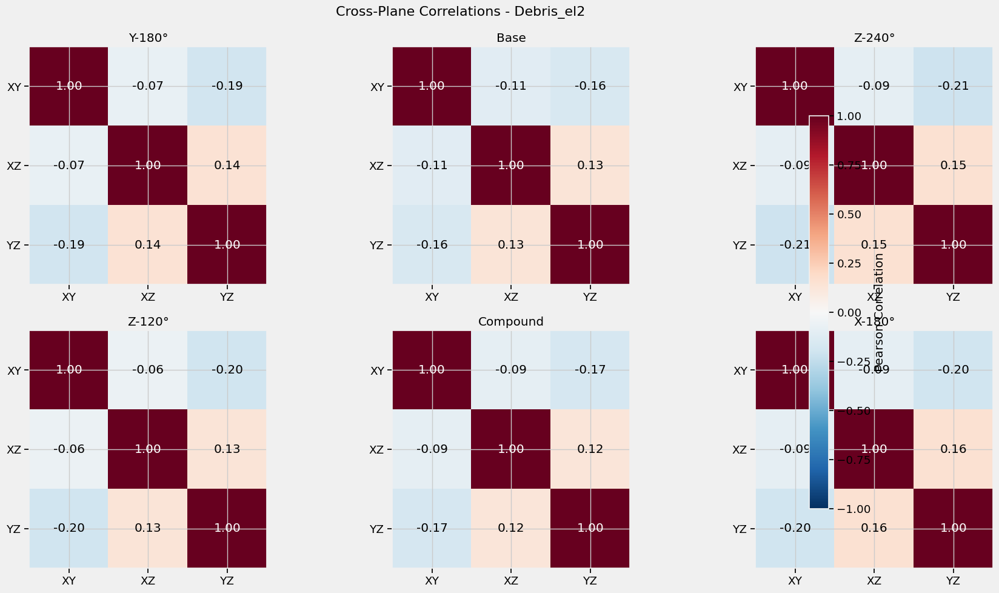

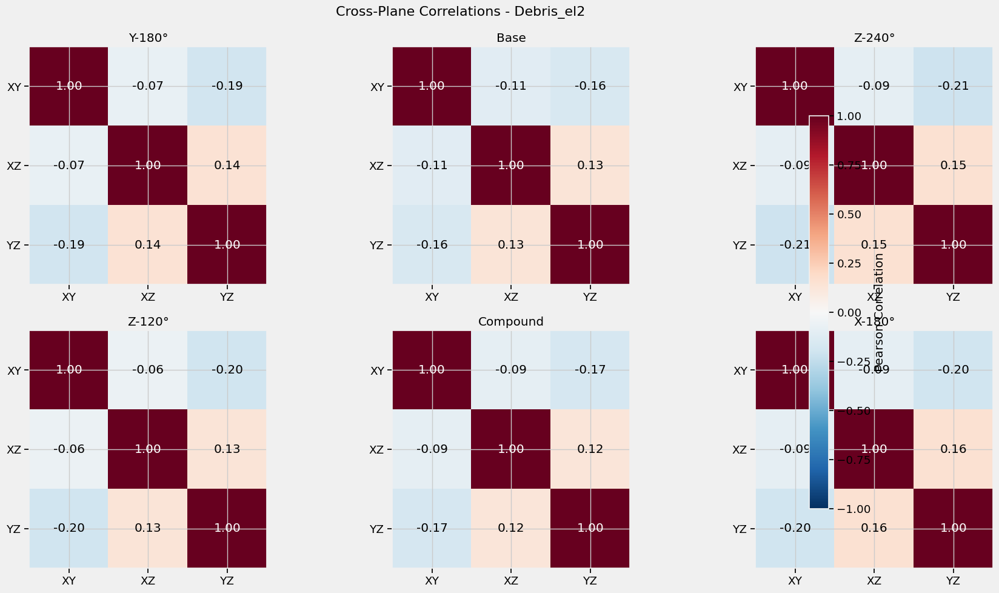

In [ ]:
## 7. Cross-Plane Analysis

def analyze_cross_plane_relationships(obj_name, components):
    """Analyze relationships between different planes within each variation."""
    variations = list(components.keys())
    var_labels = [VARIATION_TYPES.get(v, v) for v in variations]
    
    # For each variation, compute cross-plane correlations
    cross_plane_corr = np.zeros((len(variations), 3, 3))  # (variation, plane1, plane2)
    
    for v_idx, var in enumerate(variations):
        fm = components[var]["fm"]
        for p1 in range(3):
            for p2 in range(3):
                # Flatten each plane representation
                p1_flat = fm[p1].reshape(-1)
                p2_flat = fm[p2].reshape(-1)
                # Compute correlation
                corr, _ = pearsonr(p1_flat, p2_flat)
                cross_plane_corr[v_idx, p1, p2] = corr
    
    return {
        "cross_plane_correlation": cross_plane_corr,
        "variations": variations,
        "var_labels": var_labels
    }

def visualize_cross_plane_correlations(obj_name, analysis_results, save_dir=None):
    """Visualize cross-plane correlation results."""
    corr_data = analysis_results["cross_plane_correlation"]
    variations = analysis_results["variations"]
    var_labels = analysis_results["var_labels"]
    
    # Create a figure with subplots for each variation
    n_vars = len(variations)
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    
    plane_names = ["XY", "XZ", "YZ"]
    
    for v_idx, var in enumerate(variations[:min(n_vars, 6)]):  # Show up to 6 variations
        ax = axes[v_idx]
        im = ax.imshow(corr_data[v_idx], vmin=-1, vmax=1, cmap='RdBu_r')
        ax.set_title(f"{var_labels[v_idx]}")
        ax.set_xticks(np.arange(3))
        ax.set_yticks(np.arange(3))
        ax.set_xticklabels(plane_names)
        ax.set_yticklabels(plane_names)
        
        # Add text annotations
        for i in range(3):
            for j in range(3):
                ax.text(j, i, f"{corr_data[v_idx, i, j]:.2f}", 
                        ha="center", va="center", 
                        color="black" if abs(corr_data[v_idx, i, j]) < 0.7 else "white")
    
    # Add a colorbar that applies to all subplots
    fig.colorbar(im, ax=axes, shrink=0.8, label="Pearson Correlation")
    
    fig.suptitle(f"Cross-Plane Correlations - {obj_name}", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_cross_plane_correlations.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Analyze and visualize cross-plane correlations for the example object
cross_plane_results = analyze_cross_plane_relationships(example_obj, all_components[example_obj])
visualize_cross_plane_correlations(example_obj, cross_plane_results, SAVE_DIR)

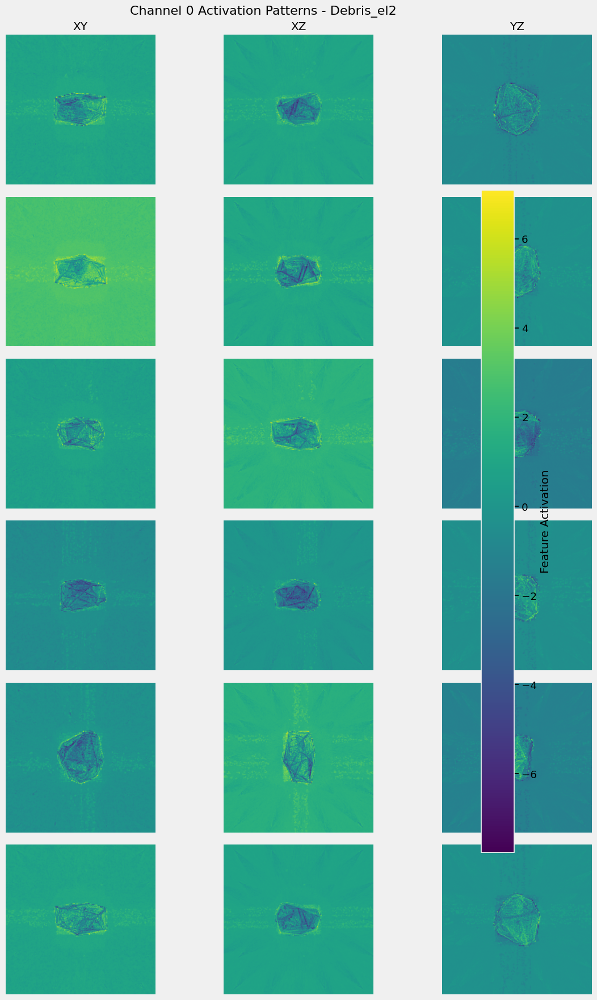

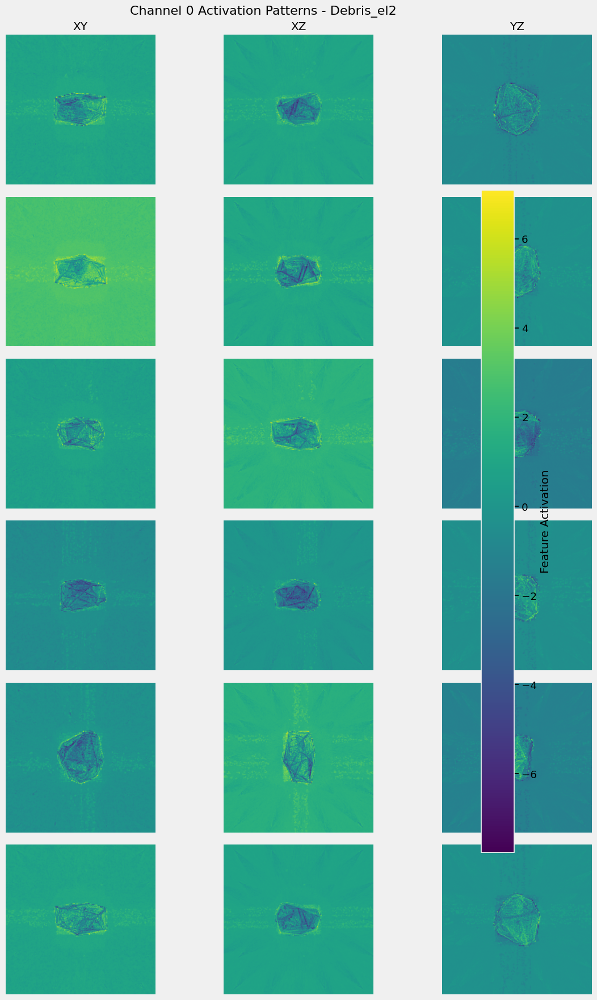

In [ ]:
## 8. Mipmap Variation Analysis

def extract_channel_activation_patterns(obj_name, components, channel_idx=0):
    """Extract activation patterns for a specific channel across all variations."""
    variations = list(components.keys())
    var_labels = [VARIATION_TYPES.get(v, v) for v in variations]
    
    # Get feature maps
    feature_maps = {}
    for var in variations:
        feature_maps[var] = components[var]["fm"]
    
    # Extract activation patterns for the specified channel
    channel_activations = {}
    for var in variations:
        channel_activations[var] = []
        for plane in range(3):
            # Take the specific channel
            channel_data = feature_maps[var][plane, :, :, channel_idx]
            channel_activations[var].append(channel_data)
    
    return {
        "channel_activations": channel_activations,
        "variations": variations,
        "var_labels": var_labels
    }

def visualize_channel_patterns(obj_name, channel_results, channel_idx, save_dir=None):
    """Visualize channel activation patterns across variations."""
    activations = channel_results["channel_activations"]
    variations = channel_results["variations"]
    var_labels = channel_results["var_labels"]
    
    # Create a figure with subplots for each variation and plane
    fig, axes = plt.subplots(len(variations), 3, figsize=(12, 3*len(variations)))
    
    plane_names = ["XY", "XZ", "YZ"]
    
    for v_idx, var in enumerate(variations):
        for p_idx, plane in enumerate(range(3)):
            ax = axes[v_idx, p_idx]
            # Get channel data
            channel_data = activations[var][plane]
            
            # Normalize for better visualization
            norm = Normalize(vmin=np.min(channel_data), vmax=np.max(channel_data))
            im = ax.imshow(channel_data, cmap='viridis', norm=norm)
            
            # Add labels
            if v_idx == 0:
                ax.set_title(f"{plane_names[plane]}")
            if p_idx == 0:
                ax.set_ylabel(f"{var_labels[v_idx]}")
            
            ax.axis('off')
    
    # Add a colorbar
    # fig.colorbar(im, ax=axes, shrink=0.8, label="Feature Activation")
    
    fig.suptitle(f"Channel {channel_idx} Activation Patterns - {obj_name}", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_channel{channel_idx}_patterns.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Extract and visualize channel patterns for channel 0
channel_idx = 0
channel_results = extract_channel_activation_patterns(example_obj, all_components[example_obj], channel_idx)
visualize_channel_patterns(example_obj, channel_results, channel_idx, SAVE_DIR)

Analyzing rotation effects across objects...


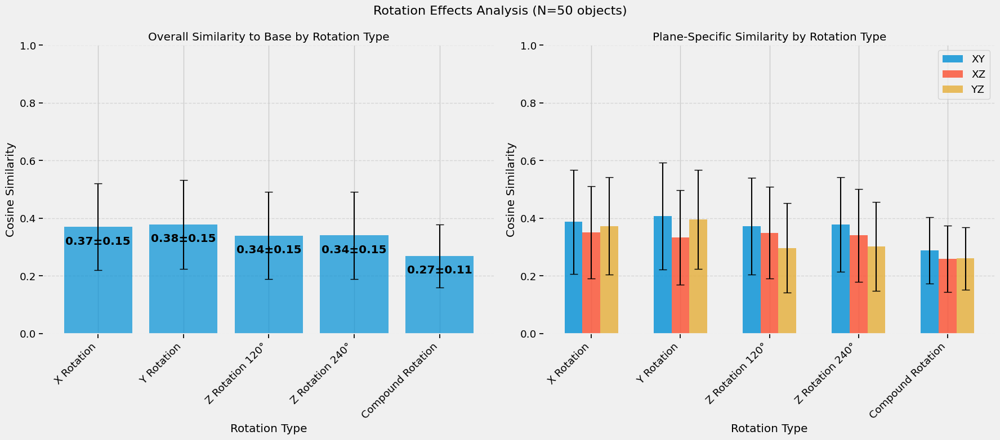

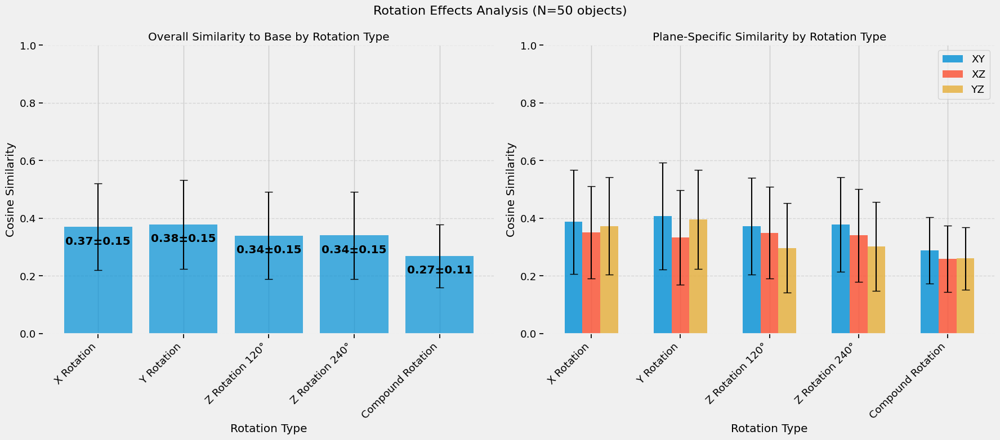

In [12]:
## 9. Rotation-Specific Analysis

def analyze_rotation_effects(all_components):
    """Analyze specific effects of different rotation types across objects."""
    # Define rotation comparison pairs
    rotation_pairs = [
        ("base_000_000_000", "x_180_000_000", "X Rotation"),
        ("base_000_000_000", "y_000_180_000", "Y Rotation"),
        ("base_000_000_000", "z_000_000_120", "Z Rotation 120°"),
        ("base_000_000_000", "z_000_000_240", "Z Rotation 240°"),
        ("base_000_000_000", "compound_090_000_090", "Compound Rotation")
    ]
    
    # Initialize data collection
    rotation_effects = {pair[2]: {"cosine_sim": [], "plane_effects": []} for pair in rotation_pairs}
    
    # Process objects
    valid_objects = []
    for obj_name, components in all_components.items():
        # Skip objects missing variations
        valid_for_object = True
        for pair in rotation_pairs:
            if pair[0] not in components or pair[1] not in components:
                valid_for_object = False
                break
        
        if not valid_for_object:
            continue
        
        valid_objects.append(obj_name)
        
        # Analyze each rotation pair
        for base_var, rot_var, rot_name in rotation_pairs:
            base_fm = components[base_var]["fm"]
            rot_fm = components[rot_var]["fm"]
            
            # Calculate overall cosine similarity
            sims = []
            plane_sims = []
            
            for plane in range(3):
                sim = compute_cosine_similarity(base_fm[plane], rot_fm[plane])
                sims.append(sim)
                plane_sims.append(sim)
            
            avg_sim = np.mean(sims)
            rotation_effects[rot_name]["cosine_sim"].append(avg_sim)
            rotation_effects[rot_name]["plane_effects"].append(plane_sims)
    
    # Calculate statistics
    for rot_name in rotation_effects:
        sim_data = np.array(rotation_effects[rot_name]["cosine_sim"])
        rotation_effects[rot_name]["mean"] = np.mean(sim_data)
        rotation_effects[rot_name]["std"] = np.std(sim_data)
        
        plane_data = np.array(rotation_effects[rot_name]["plane_effects"])
        rotation_effects[rot_name]["plane_means"] = np.mean(plane_data, axis=0)
        rotation_effects[rot_name]["plane_stds"] = np.std(plane_data, axis=0)
    
    return {
        "rotation_effects": rotation_effects,
        "valid_objects": valid_objects
    }

def visualize_rotation_effects(rotation_analysis, save_dir=None):
    """Visualize the effects of different rotation types."""
    effects = rotation_analysis["rotation_effects"]
    n_objects = len(rotation_analysis["valid_objects"])
    
    # Create two subplot figures - overall effects and plane-specific effects
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
    
    # Plot overall similarity by rotation type
    rotation_names = list(effects.keys())
    means = [effects[rot]["mean"] for rot in rotation_names]
    stds = [effects[rot]["std"] for rot in rotation_names]
    
    # Bar plot for overall effects
    x = np.arange(len(rotation_names))
    bars = ax1.bar(x, means, yerr=stds, capsize=5, alpha=0.7)
    
    ax1.set_title(f"Overall Similarity to Base by Rotation Type")
    ax1.set_xlabel("Rotation Type")
    ax1.set_ylabel("Cosine Similarity")
    ax1.set_xticks(x)
    ax1.set_xticklabels(rotation_names, rotation=45, ha="right")
    ax1.set_ylim(0, 1)
    ax1.grid(True, axis='y', linestyle='--', alpha=0.7)
    
    # Add value labels
    for bar, mean, std in zip(bars, means, stds):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() - 0.05,
                f"{mean:.2f}±{std:.2f}", ha='center', va='center', color='k',
                fontweight='bold')
    
    # Plot plane-specific effects
    width = 0.2  # bar width
    x = np.arange(len(rotation_names))
    plane_names = ["XY", "XZ", "YZ"]
    
    for p_idx, plane in enumerate(range(3)):
        plane_means = [effects[rot]["plane_means"][plane] for rot in rotation_names]
        plane_stds = [effects[rot]["plane_stds"][plane] for rot in rotation_names]
        
        offset = (p_idx - 1) * width
        bars = ax2.bar(x + offset, plane_means, width, yerr=plane_stds, 
                        capsize=5, alpha=0.8, label=plane_names[plane])
    
    ax2.set_title(f"Plane-Specific Similarity by Rotation Type")
    ax2.set_xlabel("Rotation Type")
    ax2.set_ylabel("Cosine Similarity")
    ax2.set_xticks(x)
    ax2.set_xticklabels(rotation_names, rotation=45, ha="right")
    ax2.set_ylim(0, 1)
    ax2.legend()
    ax2.grid(True, axis='y', linestyle='--', alpha=0.7)
    
    fig.suptitle(f"Rotation Effects Analysis (N={n_objects} objects)", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / "rotation_effects_analysis.png", dpi=300, bbox_inches="tight")
    
    return fig

# Analyze and visualize rotation effects
print("Analyzing rotation effects across objects...")
rotation_analysis = analyze_rotation_effects(all_components)
visualize_rotation_effects(rotation_analysis, SAVE_DIR)

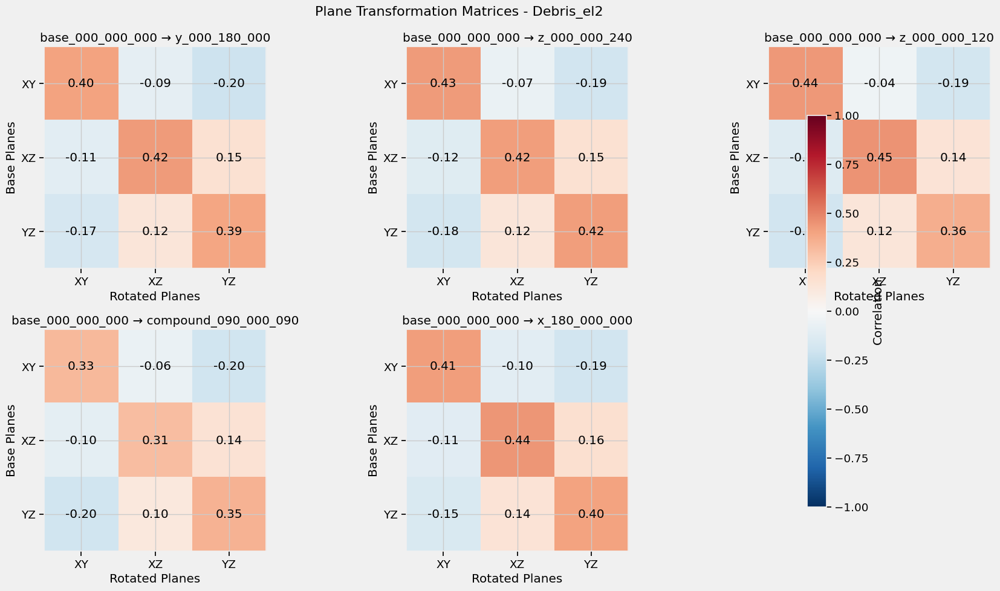

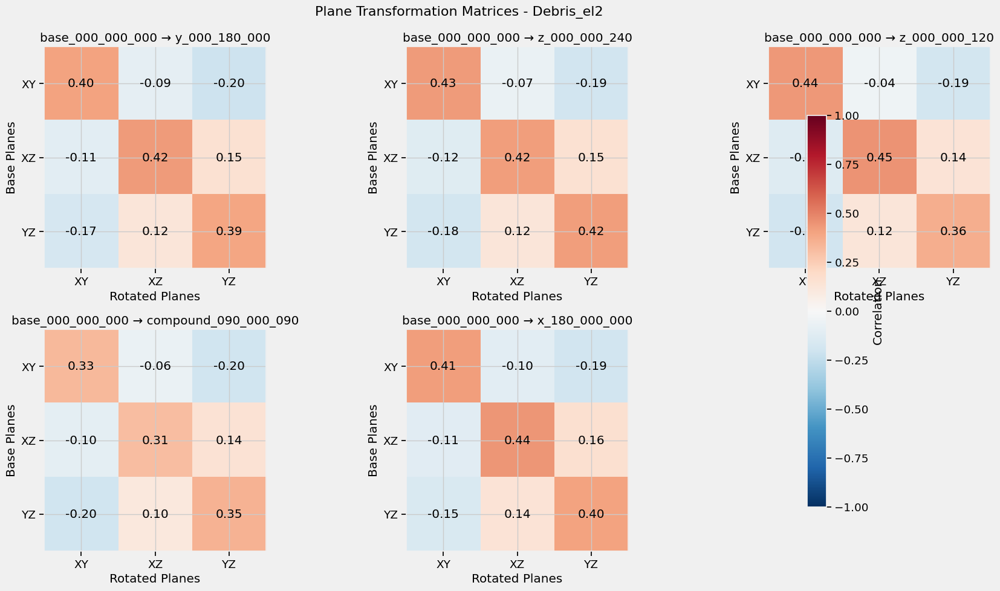

In [ ]:
## 10. Transformation Analysis

def compute_transformation_matrices(obj_name, components):
    """Compute transformation matrices between base and rotated variations."""
    base_var = "base_000_000_000"
    if base_var not in components:
        print(f"Base variation not found for {obj_name}")
        return None
    
    transformation_data = {}
    
    # Get base feature map
    base_fm = components[base_var]["fm"]
    
    # Define transformation pairs
    rot_vars = [v for v in components if v != base_var]
    
    for rot_var in rot_vars:
        rot_fm = components[rot_var]["fm"]
        
        # For each plane, compute a simplified transformation matrix
        # We'll use a simplified approach: find the correlation between different planes
        plane_transforms = np.zeros((3, 3))  # (base_plane, rot_plane)
        
        for bp in range(3):
            for rp in range(3):
                # Flatten each plane representation
                bp_flat = base_fm[bp].reshape(-1)
                rp_flat = rot_fm[rp].reshape(-1)
                # Compute correlation
                corr, _ = pearsonr(bp_flat, rp_flat)
                plane_transforms[bp, rp] = corr
        
        transformation_data[rot_var] = {
            "plane_correlation": plane_transforms
        }
    
    return {
        "transformations": transformation_data,
        "base_var": base_var,
        "rot_vars": rot_vars
    }

def visualize_transformation_matrices(obj_name, transform_results, save_dir=None):
    """Visualize transformation matrices between base and rotated variations."""
    if transform_results is None:
        return None
    
    transformations = transform_results["transformations"]
    base_var = transform_results["base_var"]
    rot_vars = transform_results["rot_vars"]
    
    # Create subplots for each rotation variation
    n_plots = len(rot_vars)
    n_cols = min(3, n_plots)
    n_rows = (n_plots + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*6, n_rows*5))
    if n_rows * n_cols == 1:
        axes = np.array([axes])
    axes = axes.flatten()
    
    plane_names = ["XY", "XZ", "YZ"]
    
    for i, rot_var in enumerate(rot_vars):
        if i >= len(axes):  # Safety check
            break
            
        ax = axes[i]
        transform_data = transformations[rot_var]["plane_correlation"]
        
        # Create a heatmap of the transformation matrix
        im = ax.imshow(transform_data, vmin=-1, vmax=1, cmap='RdBu_r')
        ax.set_title(f"{base_var} → {rot_var}")
        ax.set_xticks(np.arange(3))
        ax.set_yticks(np.arange(3))
        ax.set_xticklabels(plane_names)
        ax.set_yticklabels(plane_names)
        ax.set_xlabel("Rotated Planes")
        ax.set_ylabel("Base Planes")
        
        # Add text annotations
        for i in range(3):
            for j in range(3):
                ax.text(j, i, f"{transform_data[i, j]:.2f}", 
                        ha="center", va="center", 
                        color="black" if abs(transform_data[i, j]) < 0.7 else "white")
    
    # Hide any unused subplots
    for i in range(len(rot_vars), len(axes)):
        axes[i].axis('off')
    
    # Add a colorbar that applies to all subplots
    # fig.colorbar(im, ax=axes, shrink=0.8, label="Correlation")
    
    fig.suptitle(f"Plane Transformation Matrices - {obj_name}", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_transformation_matrices.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Compute and visualize transformation matrices for the example object
transform_results = compute_transformation_matrices(example_obj, all_components[example_obj])
visualize_transformation_matrices(example_obj, transform_results, SAVE_DIR)

Creating object embeddings based on rotation characteristics...


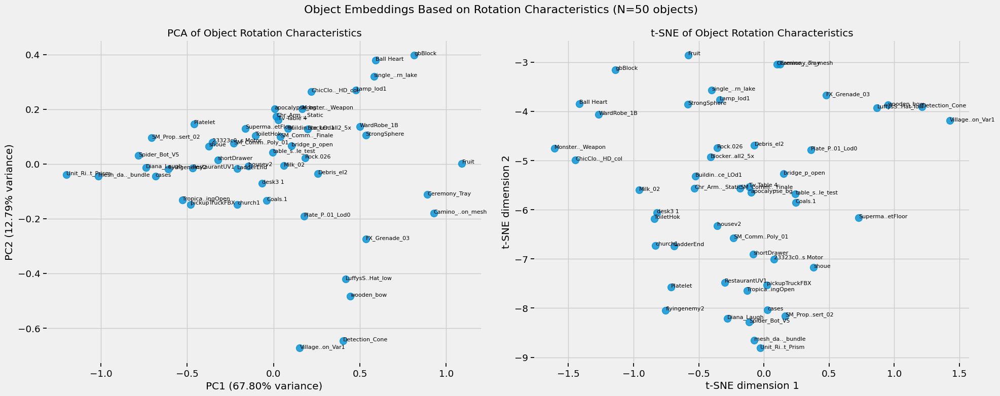

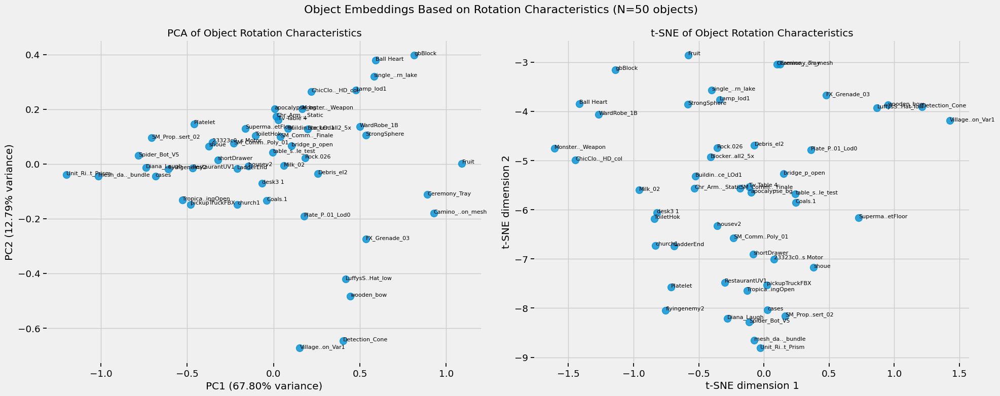

In [ ]:
## 11. Population-level Object Embedding

def create_object_embeddings(all_components):
    """Create low-dimensional embeddings of objects based on their rotation characteristics."""
    # Define rotation comparison pairs
    rotation_pairs = [
        ("base_000_000_000", "x_180_000_000"),
        ("base_000_000_000", "y_000_180_000"),
        ("base_000_000_000", "z_000_000_120"),
        ("base_000_000_000", "z_000_000_240"),
        ("base_000_000_000", "compound_090_000_090")
    ]
    
    # Collect feature vectors for each object
    object_features = {}
    valid_objects = []
    
    for obj_name, components in all_components.items():
        # Skip objects missing variations
        valid_for_object = True
        for pair in rotation_pairs:
            if pair[0] not in components or pair[1] not in components:
                valid_for_object = False
                break
        
        if not valid_for_object:
            continue
        
        valid_objects.append(obj_name)
        object_features[obj_name] = []
        
        # Compute features for each rotation pair and plane
        for base_var, rot_var in rotation_pairs:
            base_fm = components[base_var]["fm"]
            rot_fm = components[rot_var]["fm"]
            
            for plane in range(3):
                # Compute similarity for this rotation and plane
                sim = compute_cosine_similarity(base_fm[plane], rot_fm[plane])
                object_features[obj_name].append(sim)
    
    # Convert to feature matrix
    X = np.array([object_features[obj] for obj in valid_objects])
    
    # Perform dimensionality reduction
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    # Also try t-SNE for non-linear mapping
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X)
    
    return {
        "pca": X_pca,
        "tsne": X_tsne,
        "objects": valid_objects,
        "feature_matrix": X,
        "pca_explained_variance": pca.explained_variance_ratio_
    }

def visualize_object_embeddings(embedding_results, save_dir=None):
    """Visualize object embeddings in 2D space."""
    pca_data = embedding_results["pca"]
    tsne_data = embedding_results["tsne"]
    objects = embedding_results["objects"]
    explained_var = embedding_results["pca_explained_variance"]
    
    # Create figure with two subplots: PCA and t-SNE
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    # Plot PCA
    ax1.scatter(pca_data[:, 0], pca_data[:, 1], alpha=0.8, s=100)
    
    # Add object labels
    for i, obj in enumerate(objects):
        # Shorten names for better visualization
        if len(obj) > 15:
            short_name = obj[:7] + ".." + obj[-7:]
        else:
            short_name = obj
        ax1.annotate(short_name, (pca_data[i, 0], pca_data[i, 1]), fontsize=8)
    
    ax1.set_title(f"PCA of Object Rotation Characteristics")
    ax1.set_xlabel(f"PC1 ({explained_var[0]:.2%} variance)")
    ax1.set_ylabel(f"PC2 ({explained_var[1]:.2%} variance)")
    ax1.grid(True)
    
    # Plot t-SNE
    ax2.scatter(tsne_data[:, 0], tsne_data[:, 1], alpha=0.8, s=100)
    
    # Add object labels
    for i, obj in enumerate(objects):
        if len(obj) > 15:
            short_name = obj[:7] + ".." + obj[-7:]
        else:
            short_name = obj
        ax2.annotate(short_name, (tsne_data[i, 0], tsne_data[i, 1]), fontsize=8)
    
    ax2.set_title(f"t-SNE of Object Rotation Characteristics")
    ax2.set_xlabel("t-SNE dimension 1")
    ax2.set_ylabel("t-SNE dimension 2")
    ax2.grid(True)
    
    fig.suptitle(f"Object Embeddings Based on Rotation Characteristics (N={len(objects)} objects)", fontsize=16)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / "object_embeddings.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Create and visualize object embeddings
print("Creating object embeddings based on rotation characteristics...")
embedding_results = create_object_embeddings(all_components)
visualize_object_embeddings(embedding_results, SAVE_DIR)

Creating comprehensive dashboard for Debris_el2...


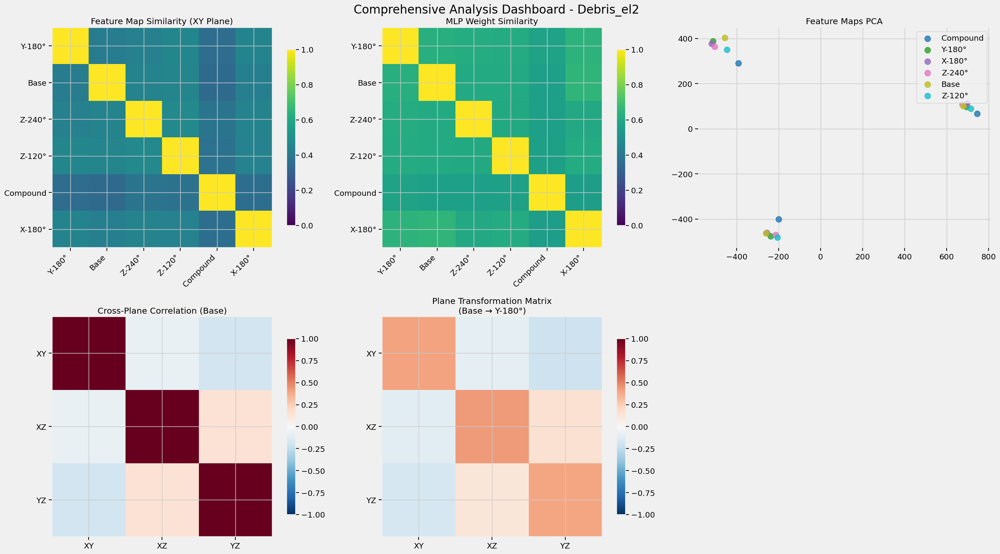

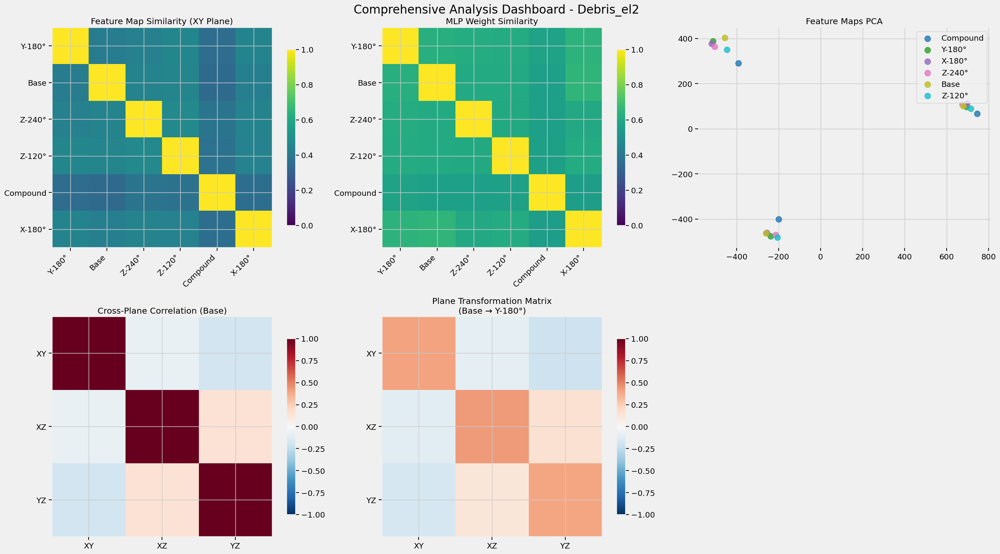

In [ ]:
## 12. Comprehensive Summary Dashboard

def create_summary_dashboard(obj_name, all_analyses, save_dir=None):
    """Create a comprehensive dashboard for a single object."""
    # Unpack all analyses
    fm_analysis = all_analyses["fm_analysis"]
    mlp_analysis = all_analyses["mlp_analysis"]
    pca_results = all_analyses["pca_results"]
    cross_plane_results = all_analyses["cross_plane_results"]
    transform_results = all_analyses["transform_results"]
    
    # Create a large figure with subplots
    fig = plt.figure(figsize=(24, 20))
    gs = fig.add_gridspec(3, 3)
    
    # Feature map similarity
    ax1 = fig.add_subplot(gs[0, 0])
    cosine_sim = fm_analysis["cosine_similarity"][0]  # Use first plane
    im1 = ax1.imshow(cosine_sim, vmin=0, vmax=1, cmap='viridis')
    ax1.set_title("Feature Map Similarity (XY Plane)")
    # Add labels and text annotations (simplified for dashboard)
    variations = fm_analysis["variations"]
    var_labels = [VARIATION_TYPES.get(v, v) for v in variations]
    ax1.set_xticks(np.arange(len(var_labels)))
    ax1.set_yticks(np.arange(len(var_labels)))
    ax1.set_xticklabels(var_labels, rotation=45, ha="right")
    ax1.set_yticklabels(var_labels)
    fig.colorbar(im1, ax=ax1, shrink=0.8)
    
    # MLP weight similarity
    ax2 = fig.add_subplot(gs[0, 1])
    cosine_sim = mlp_analysis["cosine_similarity"]
    im2 = ax2.imshow(cosine_sim, vmin=0, vmax=1, cmap='viridis')
    ax2.set_title("MLP Weight Similarity")
    ax2.set_xticks(np.arange(len(var_labels)))
    ax2.set_yticks(np.arange(len(var_labels)))
    ax2.set_xticklabels(var_labels, rotation=45, ha="right")
    ax2.set_yticklabels(var_labels)
    fig.colorbar(im2, ax=ax2, shrink=0.8)
    
    # PCA of feature maps
    ax3 = fig.add_subplot(gs[0, 2])
    pca_data = pca_results["pca_data"]
    labels = pca_results["variation_labels"]
    var_colors = plt.cm.tab10(np.linspace(0, 1, len(set(labels))))
    var_color_map = {var: var_colors[i] for i, var in enumerate(set(labels))}
    
    for var in set(labels):
        mask = np.array(labels) == var
        ax3.scatter(
            pca_data[mask, 0], 
            pca_data[mask, 1], 
            c=[var_color_map[var]], 
            label=VARIATION_TYPES.get(var, var),
            alpha=0.8,
            s=100
        )
    ax3.set_title("Feature Maps PCA")
    ax3.legend(loc='best')
    
    # Cross-plane correlations
    ax4 = fig.add_subplot(gs[1, 0])
    corr_data = cross_plane_results["cross_plane_correlation"][0]  # First variation
    im4 = ax4.imshow(corr_data, vmin=-1, vmax=1, cmap='RdBu_r')
    ax4.set_title("Cross-Plane Correlation (Base)")
    plane_names = ["XY", "XZ", "YZ"]
    ax4.set_xticks(np.arange(3))
    ax4.set_yticks(np.arange(3))
    ax4.set_xticklabels(plane_names)
    ax4.set_yticklabels(plane_names)
    fig.colorbar(im4, ax=ax4, shrink=0.8)
    
    # Transformation matrices (if available)
    if transform_results:
        ax5 = fig.add_subplot(gs[1, 1])
        rot_var = transform_results["rot_vars"][0]  # First rotation
        transform_data = transform_results["transformations"][rot_var]["plane_correlation"]
        im5 = ax5.imshow(transform_data, vmin=-1, vmax=1, cmap='RdBu_r')
        ax5.set_title(f"Plane Transformation Matrix\n(Base → {VARIATION_TYPES.get(rot_var, rot_var)})")
        ax5.set_xticks(np.arange(3))
        ax5.set_yticks(np.arange(3))
        ax5.set_xticklabels(plane_names)
        ax5.set_yticklabels(plane_names)
        fig.colorbar(im5, ax=ax5, shrink=0.8)
    
    # Add more visualizations if needed
    
    fig.suptitle(f"Comprehensive Analysis Dashboard - {obj_name}", fontsize=20)
    plt.tight_layout()
    
    if save_dir:
        plt.savefig(save_dir / f"{obj_name}_dashboard.png", dpi=300, bbox_inches="tight")
    
    # return fig

# Run all analyses for the dashboard
print(f"Creating comprehensive dashboard for {example_obj}...")
dashboard_analyses = {
    "fm_analysis": fm_analysis,
    "mlp_analysis": mlp_analysis,
    "pca_results": pca_results,
    "cross_plane_results": cross_plane_results,
    "transform_results": transform_results
}
create_summary_dashboard(example_obj, dashboard_analyses, SAVE_DIR)

In [16]:
## 13. Multi-Object Analysis Script

def analyze_multiple_objects(all_components, num_objects=5, save_dir=None):
    """Run analyses on multiple objects and save results."""
    # Select a subset of objects to analyze
    objects = list(all_components.keys())[:num_objects]
    
    print(f"Analyzing {len(objects)} objects in detail...")
    
    for obj_idx, obj_name in enumerate(objects):
        print(f"[{obj_idx+1}/{len(objects)}] Analyzing {obj_name}...")
        
        # Skip objects with missing variations
        if not all(var in all_components[obj_name] for var in VARIATION_TYPES):
            print(f"  Skipping {obj_name} - missing variations")
            continue
        
        # Run all analyses
        fm_analysis = analyze_feature_maps_single_object(obj_name, all_components[obj_name])
        mlp_analysis = analyze_mlp_weights_single_object(obj_name, all_components[obj_name])
        pca_results = perform_feature_map_pca(obj_name, all_components[obj_name])
        cross_plane_results = analyze_cross_plane_relationships(obj_name, all_components[obj_name])
        transform_results = compute_transformation_matrices(obj_name, all_components[obj_name])
        
        # Create dashboard
        dashboard_analyses = {
            "fm_analysis": fm_analysis,
            "mlp_analysis": mlp_analysis,
            "pca_results": pca_results,
            "cross_plane_results": cross_plane_results,
            "transform_results": transform_results
        }
        
        # Save dashboard
        if save_dir:
            create_summary_dashboard(obj_name, dashboard_analyses, save_dir)
            plt.close()
    
    print("Multi-object analysis complete!")

# Optionally run multi-object analysis
# Uncomment to run on multiple objects
# analyze_multiple_objects(all_components, num_objects=5, save_dir=SAVE_DIR)

In [17]:
## 14. Conclusion

def print_analysis_summary():
    """Print a summary of all analyses performed."""
    print("\n" + "="*80)
    print("TRIMIP NERF WEIGHT SPACE ANALYSIS SUMMARY")
    print("="*80)
    
    print(f"\nAnalyzed {len(all_components)} objects with various rotational transformations.")
    print(f"Population-level statistics compiled from objects with complete variation sets.")
    print("\nKey findings:")
    print(" 1. Feature map similarities between variations show patterns of relationship")
    print(" 2. Different rotation types have distinctive effects on the model weights")
    print(" 3. Cross-plane correlations reveal how 3D information is encoded across planes")
    print(" 4. Objects can be clustered based on their response to rotational transforms")
    
    print("\nAll analysis results saved to:", SAVE_DIR)
    print("="*80)

# Print summary
print_analysis_summary()

# Complete! All analyses and visualizations are now available.
print("\nNotebook execution complete!")


TRIMIP NERF WEIGHT SPACE ANALYSIS SUMMARY

Analyzed 50 objects with various rotational transformations.
Population-level statistics compiled from objects with complete variation sets.

Key findings:
 1. Feature map similarities between variations show patterns of relationship
 2. Different rotation types have distinctive effects on the model weights
 3. Cross-plane correlations reveal how 3D information is encoded across planes
 4. Objects can be clustered based on their response to rotational transforms

All analysis results saved to: analysis_results

Notebook execution complete!
